# CS 175 PROJECT - GROUP 25

# IMAGE DENOISING METHOD USING CNNs with Residual Blocks

Team member:
1. An Le - 93258317 - antl2@uci.edu
2. Son Le - 

In [2]:
# Import libraries
from __future__ import print_function, division

import torch
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import DataLoader, Dataset
from torch.utils.data import sampler
import matplotlib.pyplot as plt
import torchvision
import torch.nn as nn
import numpy as np
import os.path

# Import our .py files
import helpers as h
import dataset
from dataset import ImageDenoisingDataset
import model
from model import MyModel

%reload_ext autoreload

%autoreload 2

Total number of train data points: 36


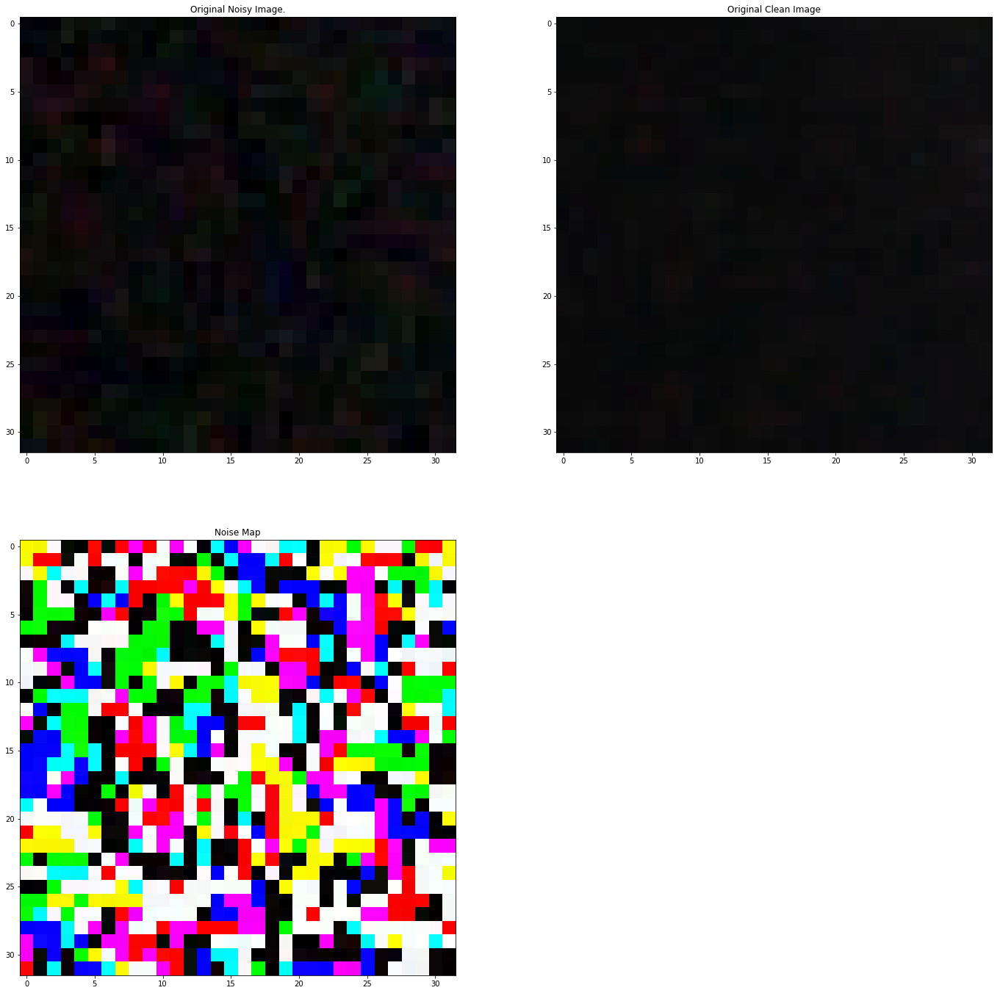

In [3]:
##### Load training dataset

noisy_train_path = 'dataset/T3i/NoisyTrain'
truth_train_path = 'dataset/T3i/RefTrain'

noisy_pil_imgs = dataset.load_images_folder(noisy_train_path, 'bmp')
truth_pil_imgs = dataset.load_images_folder(truth_train_path, 'bmp')

train_dataset = ImageDenoisingDataset(noisy_pil_imgs, truth_pil_imgs, random_crop=True, color_jitter=True, cropped_resolution=(32,32))
train_dataset_non_transform = ImageDenoisingDataset(noisy_pil_imgs, truth_pil_imgs, cropped_resolution=(512,512))

# Print information
print('Total number of train data points: ' + str(train_dataset.__len__()))

# Print a sample data point
sampl_n, sampl_t = train_dataset[2]
h.show_sample_image(sampl_n, sampl_t)

Total number of test data points: 4


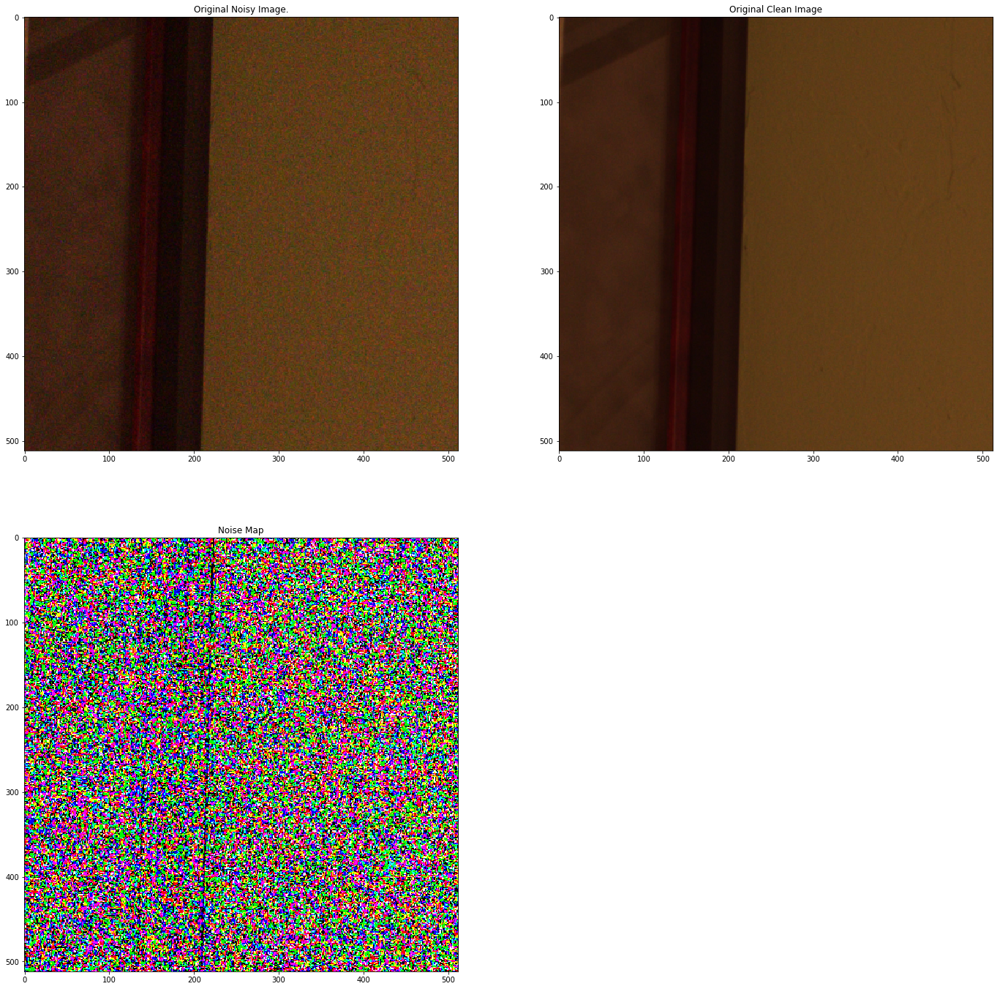

In [3]:
noisy_test_path = 'dataset/T3i/NoisyTest'
truth_test_path = 'dataset/T3i/RefTest'
noisy_test_imgs = dataset.load_images_folder(noisy_test_path, 'bmp')
truth_test_imgs = dataset.load_images_folder(truth_test_path, 'bmp')


#test_dataset = ImageDenoisingDataset(noisy_test_imgs, truth_test_imgs, random_crop=True, color_jitter=True, cropped_resolution=(128, 128))
#test_dataset_1024px = ImageDenoisingDataset(noisy_test_imgs, truth_test_imgs, cropped_resolution=(1024, 1024))
test_dataset_512px = ImageDenoisingDataset(noisy_test_imgs, truth_test_imgs, cropped_resolution=(512, 512))
#test_dataset_256px = ImageDenoisingDataset(noisy_test_imgs, truth_test_imgs, cropped_resolution=(256, 256))


# Print information
print('Total number of test data points: ' + str(test_dataset_512px.__len__()))

# Print a sample data point
sampl_n, sampl_t = test_dataset_512px[2]
h.show_sample_image(sampl_n, sampl_t)

In [4]:
# Define pytorch datatype

print(torch.cuda.is_available())
gpu_dtype = torch.cuda.FloatTensor
cpu_type = torch.FloatTensor

True


In [5]:
# Pre-trained model file path. Change this to new filepath to train new model.
model_file_path = "final-model"
train_new_model = not os.path.isfile(model_file_path)

# Set dtype to gpu_dtype if CUDA is available
dtype = gpu_dtype

# Training parameters
learning_rate = 1e-3
learning_rate_decay_multiplier = 0.985
loss_fn = nn.L1Loss().type(dtype)
num_epochs = 1200
print_every_epoch = 100
display_epoch_info = True

# Dataloader parameters
batch_size = 5
shuffle = True
num_workers=0

# Model hyper-parameters
# See model.py for detail
img_channels = 3 
out_features = 64
num_res_blocks=5
bias=True

In [6]:
epochs = []
loss_vals = []
learning_rates = []

if train_new_model:

    # Use Pytorch's dataloader to load mini batches
    dataloader = DataLoader(dataset=train_dataset, num_workers=num_workers, batch_size=batch_size, shuffle=shuffle)

    # Create a model instance with correct dtype and put it on training mode
    model = MyModel(img_channels, out_features, num_res_blocks, bias, dtype=dtype)
    model.train()  
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    
    if display_epoch_info:
        print('Epoch/Total, Learning Rate, Average Loss')

    for epoch in range(num_epochs):
        avg_loss = 0
        count = 0
        
        # Decrease learning rate per each epoch
        learning_rate = learning_rate * learning_rate_decay_multiplier
        for param_group in optimizer.param_groups:
            param_group["lr"] = learning_rate

        # Train with mini batches from dataloader
        for t, (batch_noise, batch_truth) in enumerate(dataloader):
            bn_var = Variable(batch_noise.type(dtype))
            bt_var = Variable(batch_truth.type(dtype))
            output = model(bn_var)

            loss = loss_fn(output,bt_var)
            
            avg_loss += loss.item()
            count += 1

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
        # Print epoch info
        avg_loss /= count
        if display_epoch_info and epoch % print_every_epoch == 0:
            print('%d / %d, %.20f, %.10f' % (epoch + 1, num_epochs, learning_rate, avg_loss))
            epochs.append(epoch+1)
            loss_vals.append(avg_loss)
            learning_rates.append(learning_rate)
            
            
    # Save model
    print('Finised training - Saved model as ' + model_file_path)
    torch.save(model, model_file_path)

Epoch/Total, Learning Rate, Average Loss
1 / 1200, 0.00098499999999999998, 0.0953642847
101 / 1200, 0.00021729977681234644, 0.0274116147
201 / 1200, 0.00004793826700781277, 0.0185362140
301 / 1200, 0.00001057560885438415, 0.0280268047
401 / 1200, 0.00000233307354691609, 0.0320009633
501 / 1200, 0.00000051469681323011, 0.0236632980
601 / 1200, 0.00000011354670318876, 0.0240291458
701 / 1200, 0.00000002504941447786, 0.0225885015
801 / 1200, 0.00000000552612403586, 0.0273584643
901 / 1200, 0.00000000121911220267, 0.0239598764
1001 / 1200, 0.00000000026894701477, 0.0241627647
1101 / 1200, 0.00000000005933210790, 0.0270859710
Finised training - Saved model as final-model


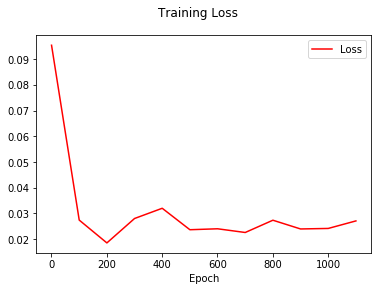

In [7]:
# Plot loss values
plt.plot(epochs, loss_vals, color='red', label='Loss')
plt.xlabel('Epoch')
plt.legend()
plt.suptitle('Training Loss')
plt.show()

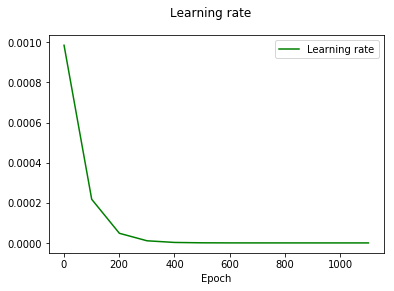

In [8]:
# Plot learning rates
plt.plot(epochs, learning_rates, color='green', label='Learning rate')
plt.xlabel('Epoch')
plt.suptitle('Learning rate')
plt.legend()
plt.show()

In [9]:
#### Load an existing model
model = torch.load(model_file_path)
model.eval()

def evaluate(model, noise_image, clean_image, dtype, shape=(512,512)):
    test_n_var = Variable(noise_image.reshape(1,3,shape[0],shape[1]).type(dtype))
    if dtype == gpu_dtype:
        output_tensor = model(test_n_var).cpu()
    else:
        output_tensor = model(test_n_var)
    test_o = output_tensor[0].detach()
    print("L1Loss of denoised image: " + str(loss_fn(test_o,test_t)))
    print("L1Loss of original noisy: " + str(loss_fn(test_n,test_t)))
    print("PSNR - original noisy: " + str(h.psnr(np.array(test_n), np.array(test_t))))
    print("PSNR - denoised: " + str(h.psnr(np.array(test_o), np.array(test_t))))
    h.show_image_comparision(test_n, test_t, test_o)

In [10]:
print ('Num -- Noisy PSNR -- Our Denoised PSNR')
for i in range(test_dataset_512px.__len__()):
    test_n, test_t = test_dataset_512px[i]
    test_n_var = Variable(test_n.reshape(1,3,512,512).type(dtype))
    if dtype == gpu_dtype:
        output_tensor = model(test_n_var).cpu()
    else:
        output_tensor = model(test_n_var)
    test_o = output_tensor[0].detach()
    psnr_noisy = h.psnr(np.array(test_n), np.array(test_t))
    psnr_our = h.psnr(np.array(test_o), np.array(test_t))
    print('%d -- %.2f -- %.2f' %(i, psnr_noisy, psnr_our)) 

Num -- Noisy PSNR -- Our Denoised PSNR
0 -- 75.48 -- 82.72
1 -- 81.32 -- 87.46
2 -- 78.64 -- 85.60
3 -- 76.85 -- 82.07


L1Loss of denoised image: tensor(0.0138)
L1Loss of original noisy: tensor(0.0317)
PSNR - original noisy: 75.478763393799
PSNR - denoised: 82.72395417655956


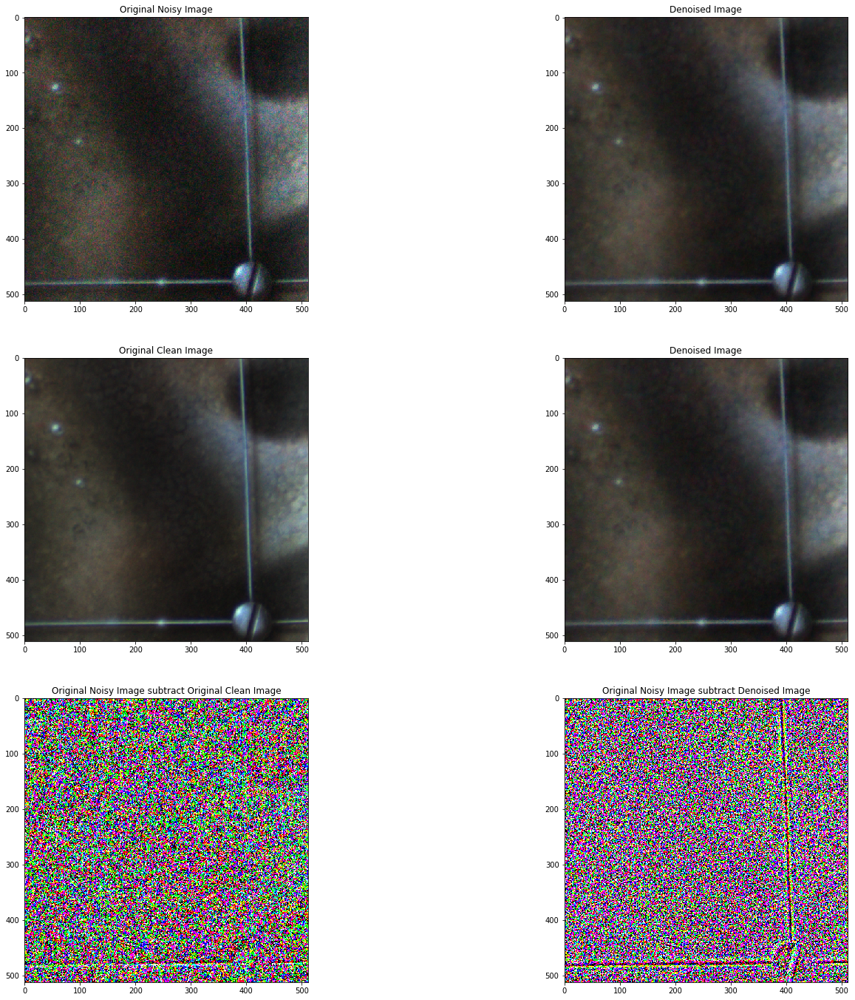

In [11]:
test_n, test_t = test_dataset_512px[0]
evaluate(model, test_n, test_t, dtype, shape=(512,512))

L1Loss of denoised image: tensor(0.0079)
L1Loss of original noisy: tensor(0.0159)
PSNR - original noisy: 81.32069895399789
PSNR - denoised: 87.45678906353908


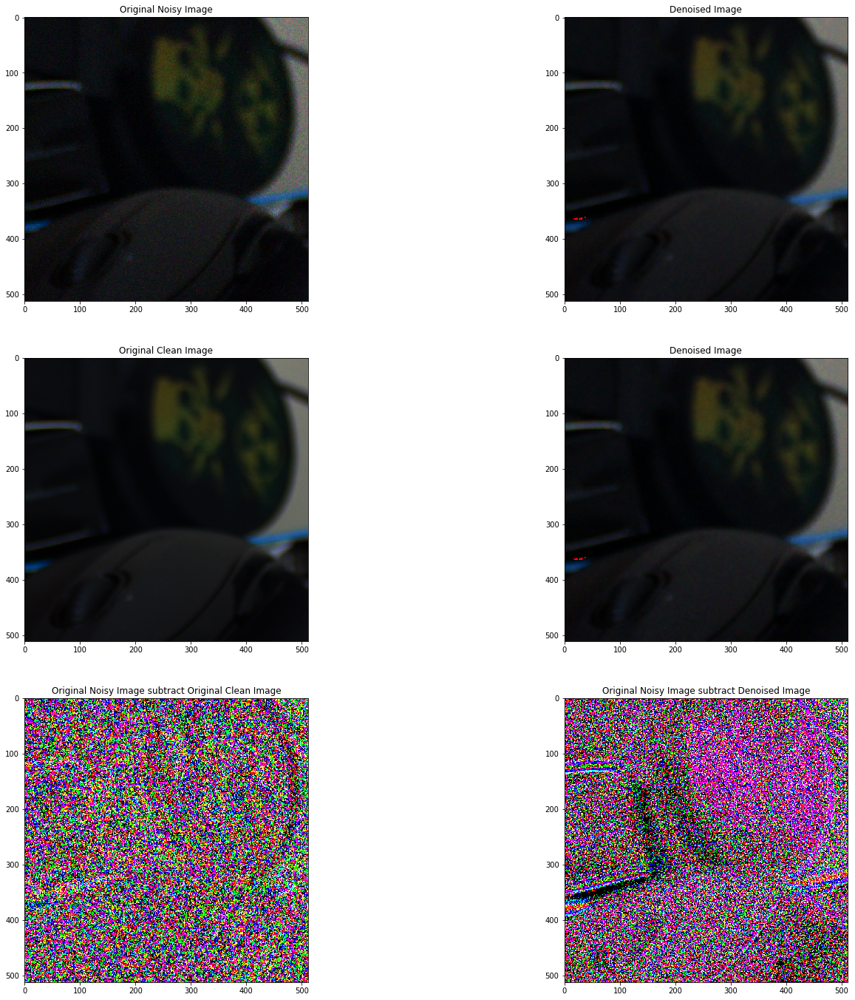

In [12]:
test_n, test_t = test_dataset_512px[1]
evaluate(model, test_n, test_t, dtype, shape=(512,512))

L1Loss of denoised image: tensor(0.0103)
L1Loss of original noisy: tensor(0.0224)
PSNR - original noisy: 78.63882705953644
PSNR - denoised: 85.59809763840704


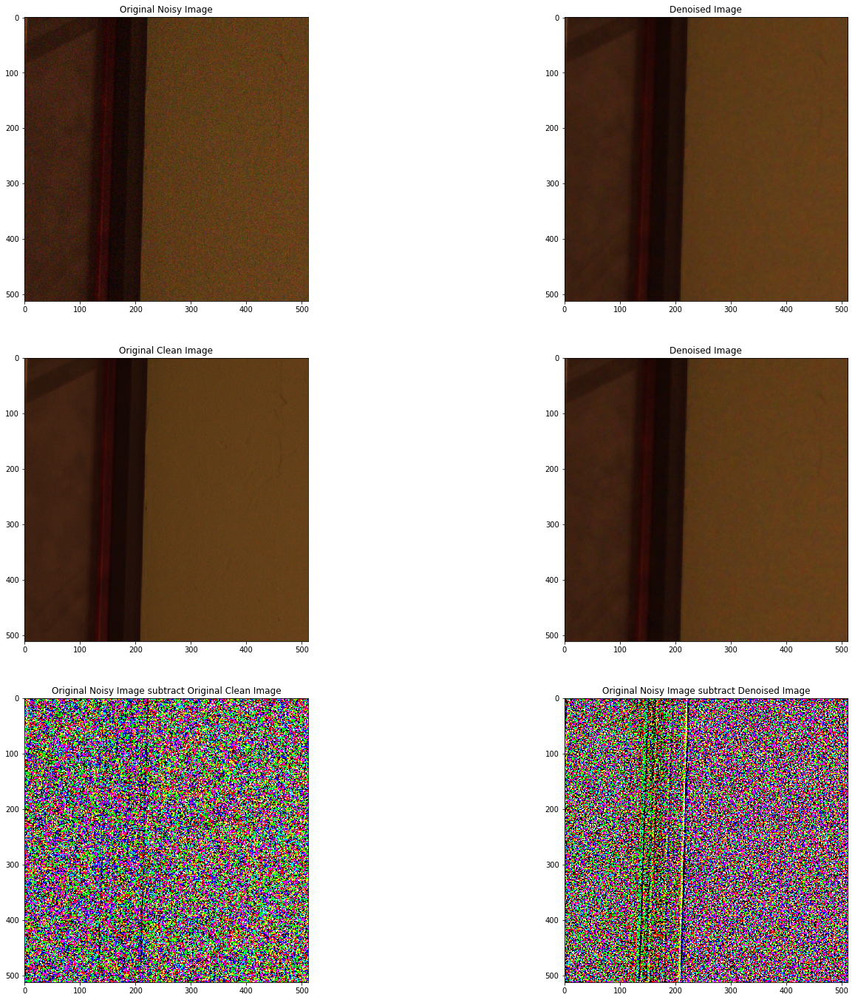

In [13]:
test_n, test_t = test_dataset_512px[2]
evaluate(model, test_n, test_t, dtype, shape=(512,512))

L1Loss of denoised image: tensor(0.0147)
L1Loss of original noisy: tensor(0.0263)
PSNR - original noisy: 76.84870392780924
PSNR - denoised: 82.06666312293916


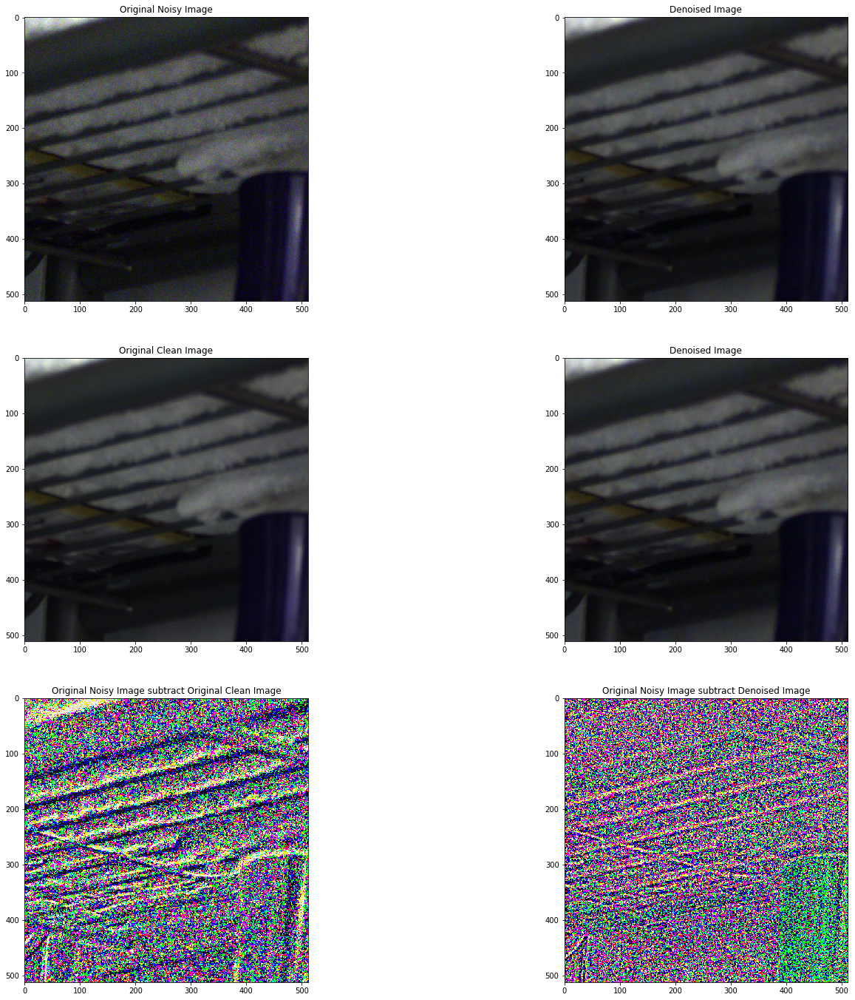

In [14]:
test_n, test_t = test_dataset_512px[3]
evaluate(model, test_n, test_t, dtype, shape=(512,512))

In [16]:
noisy_compare_path = 'dataset/BM3DLena/Noisy'
truth_compare_path = 'dataset/BM3DLena/Truth'
bm3d_compare_path = 'dataset/BM3DLena/bm3d-denoised'
noisy_compare_imgs = dataset.load_images_folder(noisy_compare_path, 'png')
truth_compare_imgs = dataset.load_images_folder(truth_compare_path, 'png')
bm3d_compare_imgs = dataset.load_images_folder(bm3d_compare_path, 'png')


#test_dataset = ImageDenoisingDataset(noisy_test_imgs, truth_test_imgs, random_crop=True, color_jitter=True, cropped_resolution=(128, 128))
compare_dataset_512px = ImageDenoisingDataset(noisy_compare_imgs, truth_compare_imgs, cropped_resolution=(512, 512))

# Print information
print('Total number of compare data points: ' + str(compare_dataset_512px.__len__()))


print ('Num -- Noisy PSNR -- Our Denoised PSNR -- BM3D PSNR')
for i in range(compare_dataset_512px.__len__()):
    test_n, test_t = compare_dataset_512px[i]
    test_n_var = Variable(test_n.reshape(1,3,512,512).type(dtype))
    if dtype == gpu_dtype:
        output_tensor = model(test_n_var).cpu()
    else:
        output_tensor = model(test_n_var)
    test_o = output_tensor[0].detach()
    test_o_img = dataset.ToImage(test_o)
    test_o_img.save('Lena-Num' + str(i) + '.png')
    test_bm3d = dataset.ToTensor(bm3d_compare_imgs[i])
    psnr_noisy = h.psnr(np.array(test_n), np.array(test_t))
    psnr_our = h.psnr(np.array(test_o), np.array(test_t))
    psnr_bm3d = h.psnr(np.array(test_bm3d), np.array(test_t))
    print('%d -- %.2f -- %.2f -- %.2f' %(i, psnr_noisy, psnr_our, psnr_bm3d)) 

Total number of compare data points: 15
Num -- Noisy PSNR -- Our Denoised PSNR -- BM3D PSNR
0 -- 76.29 -- 77.98 -- 83.33
1 -- 58.41 -- 64.73 -- 75.24
2 -- 72.82 -- 76.58 -- 82.06
3 -- 70.38 -- 75.28 -- 81.14
4 -- 68.51 -- 74.11 -- 80.40
5 -- 67.00 -- 73.06 -- 79.72
6 -- 65.74 -- 72.12 -- 79.04
7 -- 64.68 -- 71.27 -- 78.24
8 -- 82.28 -- 79.40 -- 85.92
9 -- 62.96 -- 69.76 -- 78.01
10 -- 61.62 -- 68.46 -- 77.34
11 -- 60.56 -- 67.33 -- 76.76
12 -- 60.11 -- 66.82 -- 76.49
13 -- 59.70 -- 66.34 -- 76.25
14 -- 59.00 -- 65.48 -- 75.78
